# Thrivelines from a saved correlation matrix

Thrivelines show how a z-score is expected to evolve over one covariate step
(by default, one year). To estimate them we need to know the correlation matrix (= how strongly z-scores correlate across ages).

In pcntoolkit the correlation matrix lives in the `CorrelationMatrix` class, and everything downstream, scoring subjects and drawing
thrivelines, needs only that matrix plus a fitted normative model.

In this notebook we plot thrivelines using a precomputed correlation matrix. The matrix already carries everything learned from a longitudinal cohort, so no longitudinal data is needed to plot them.

> **Note:** the normative model is downloaded automatically from SURFdrive, but the correlation matrix exists in a private directory.

In [1]:
import matplotlib.pyplot as plt
import numpy as np


from pcntoolkit import CorrelationMatrix, NormativeModel, ZGainScore
from pcntoolkit.util.plotter import plot_thrivelines

In [2]:
from scipy import stats


In [3]:
import warnings
from pandas.errors import PerformanceWarning
MODEL_PATH= '/project_cephfs/3022017.06/projects/lifespan_hbr/johbay/Velocity/CODE_new/revision/save_dir_DK_ADNI_demented_revision/'

model = NormativeModel.load(str(MODEL_PATH))
print("covariates:   ", model.covariates)
print("response vars:", list(model.response_vars))

/home/preclineu/johbay/.conda/envs/pcntoolkit_velocity/lib/python3.12/site-packages/pcntoolkit/util/output.py:309: UserWarning: Process: 2085053 - 2026-09-11 20:23:53 - This model was saved with PCNtoolkit v1.1.2, but you are running v1.3.0. Loading this model in v1.3.0...
  warnings.warn(message, category)
/home/preclineu/johbay/.conda/envs/pcntoolkit_velocity/lib/python3.12/site-packages/pcntoolkit/util/output.py:309: UserWarning: Process: 2085053 - 2026-09-11 20:23:55 - This model was saved with PCNtoolkit v1.1.2, but you are running v1.3.0. Loading this model in v1.3.0...
  warnings.warn(message, category)
/home/preclineu/johbay/.conda/envs/pcntoolkit_velocity/lib/python3.12/site-packages/pcntoolkit/util/output.py:309: UserWarning: Process: 2085053 - 2026-09-11 20:23:56 - This model was saved with PCNtoolkit v1.1.2, but you are running v1.3.0. Loading this model in v1.3.0...
  warnings.warn(message, category)
/home/preclineu/johbay/.conda/envs/pcntoolkit_velocity/lib/python3.12/sit

covariates:    ['age']
response vars: ['L_caudalmiddlefrontal', 'R_caudalmiddlefrontal', 'R_lateraloccipital', 'L_paracentral', 'R_temporalpole', 'L_transversetemporal', 'L_temporalpole', 'L_rostralmiddlefrontal', 'R_precentral', 'L_posteriorcingulate', 'R_parstriangularis', 'L_superiorparietal', 'L_lateraloccipital', 'R_inferiortemporal', 'L_superiorfrontal', 'R_medialorbitofrontal', 'R_supramarginal', 'L_fusiform', 'R_middletemporal', 'L_supramarginal', 'R_rostralanteriorcingulate', 'R_entorhinal', 'L_insula', 'Mean_Thickness', 'L_isthmuscingulate', 'R_insula', 'R_fusiform', 'R_frontalpole', 'R_bankssts', 'L_caudalanteriorcingulate', 'L_precentral', 'L_entorhinal', 'R_isthmuscingulate', 'R_superiorparietal', 'L_parahippocampal', 'L_parsorbitalis', 'R_transversetemporal', 'R_paracentral', 'R_caudalanteriorcingulate', 'L_rostralanteriorcingulate', 'L_inferiorparietal', 'R_inferiorparietal', 'L_medialorbitofrontal', 'R_superiorfrontal', 'L_bankssts', 'Median_Thickness', 'R_parahippocamp

/home/preclineu/johbay/.conda/envs/pcntoolkit_velocity/lib/python3.12/site-packages/pcntoolkit/util/output.py:309: UserWarning: Process: 2085053 - 2026-09-11 20:25:09 - This model was saved with PCNtoolkit v1.1.2, but you are running v1.3.0. Loading this model in v1.3.0...
  warnings.warn(message, category)


In [4]:
features_to_model = [
     'L_bankssts',
  'L_caudalanteriorcingulate',
  'L_caudalmiddlefrontal',
  'L_cuneus',
  'L_entorhinal',
  'L_fusiform',
  'L_inferiorparietal',
  'L_inferiortemporal',
  'L_isthmuscingulate',
  'L_lateraloccipital',
  'L_lateralorbitofrontal',
  'L_lingual',
  'L_medialorbitofrontal',
  'L_middletemporal',
  'L_parahippocampal',
  'L_paracentral',
  'L_parsopercularis',
  'L_parsorbitalis',
  'L_parstriangularis',
  'L_pericalcarine',
  'L_postcentral',
  'L_posteriorcingulate',
  'L_precentral',
  'L_precuneus',
  'L_rostralanteriorcingulate',
  'L_rostralmiddlefrontal',
  'L_superiorfrontal',
  'L_superiorparietal',
  'L_superiortemporal',
  'L_supramarginal',
  'L_frontalpole',
  'L_temporalpole',
  'L_transversetemporal',
  'L_insula',
  'R_bankssts',
  'R_caudalanteriorcingulate',
  'R_caudalmiddlefrontal',
  'R_cuneus',
  'R_entorhinal',
  'R_fusiform',
  'R_inferiorparietal',
  'R_inferiortemporal',
  'R_isthmuscingulate',
  'R_lateraloccipital',
  'R_lateralorbitofrontal',
  'R_lingual',
  'R_medialorbitofrontal',
  'R_middletemporal',
  'R_parahippocampal',
  'R_paracentral',
  'R_parsopercularis',
  'R_parsorbitalis',
  'R_parstriangularis',
  'R_pericalcarine',
  'R_postcentral',
  'R_posteriorcingulate',
  'R_precentral',
  'R_precuneus',
  'R_rostralanteriorcingulate',
  'R_rostralmiddlefrontal',
  'R_superiorfrontal',
  'R_superiorparietal',
  'R_superiortemporal',
  'R_supramarginal',
  'R_frontalpole',
  'R_temporalpole',
  'R_transversetemporal',
  'R_insula',
  'Mean_Thickness',
  'Median_Thickness'
 ]

## 1. Load precomputed correlation matrix

`load()` loads only one specific file layout: the velocity models from Johanna
Bayer's pipeline, saved in `batch_<n>_<region>/Velocity/<file>.pkl`. The region name is not stored inside the file, so it is read from the directory name.

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:31:47 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:31:47 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:31:47 - Computing centiles for L_bankssts.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


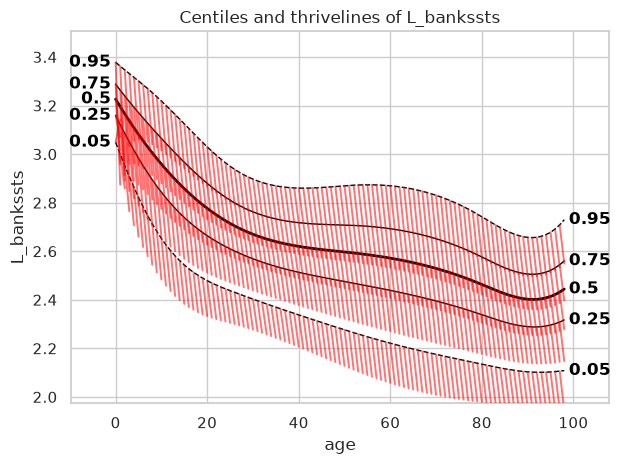

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:33:52 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:33:52 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:33:52 - Computing centiles for L_caudalanteriorcingulate.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


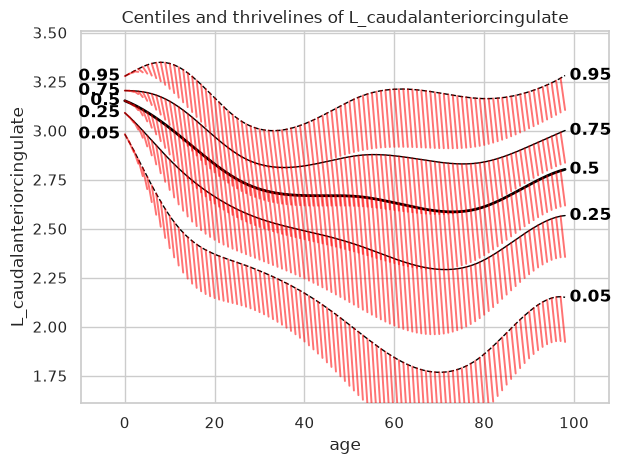

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:35:23 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:35:23 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:35:23 - Computing centiles for L_caudalmiddlefrontal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


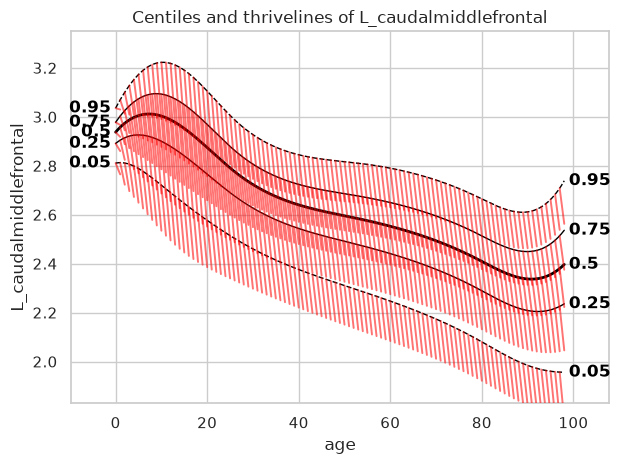

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:36:52 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:36:52 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:36:52 - Computing centiles for L_cuneus.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


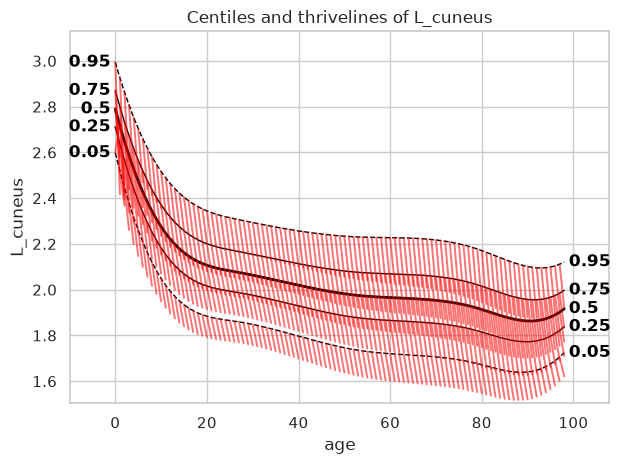

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:38:18 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:38:18 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:38:18 - Computing centiles for L_entorhinal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


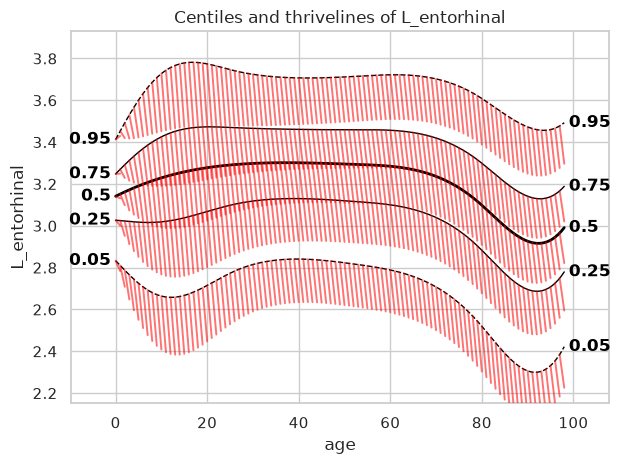

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:39:44 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:39:44 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:39:44 - Computing centiles for L_fusiform.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


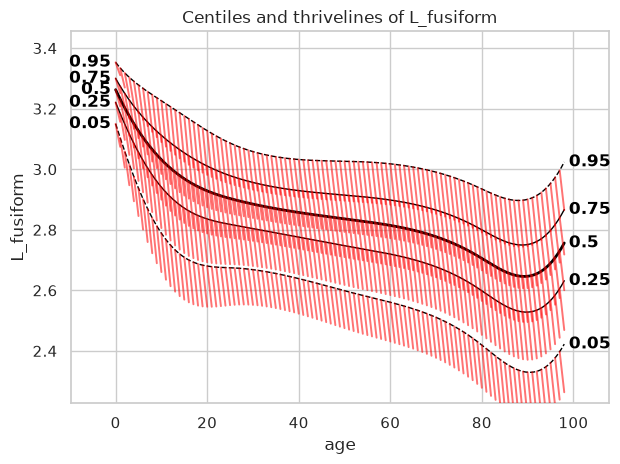

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:41:09 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:41:09 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:41:09 - Computing centiles for L_inferiorparietal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


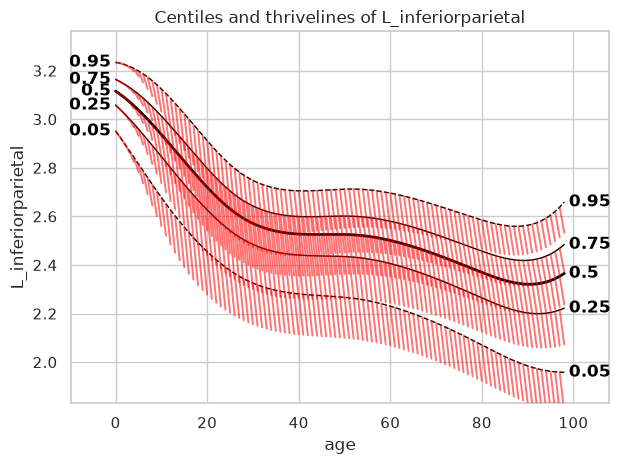

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:42:40 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:42:40 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:42:40 - Computing centiles for L_inferiortemporal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


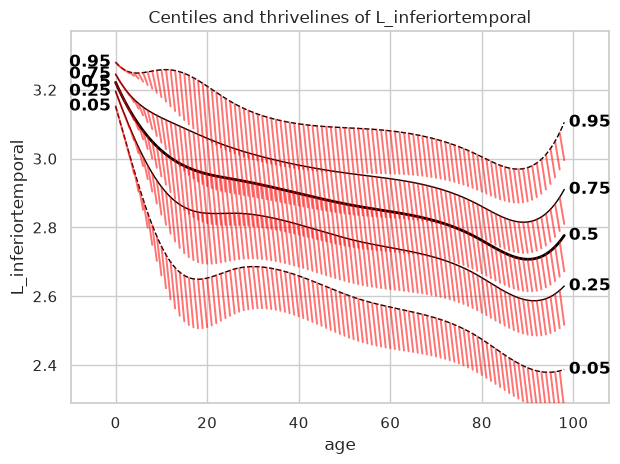

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:44:18 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:44:18 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:44:18 - Computing centiles for L_isthmuscingulate.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


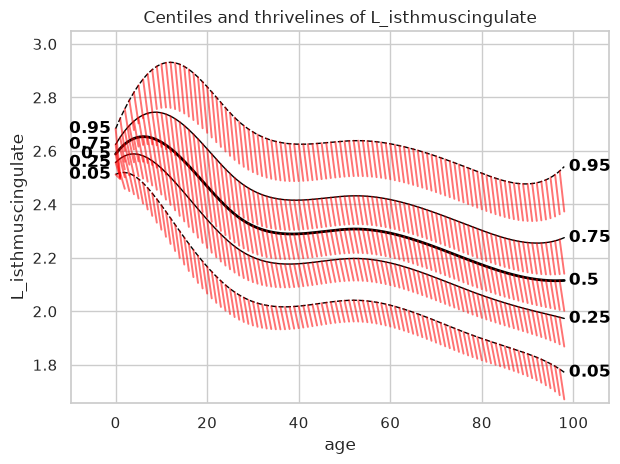

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:45:33 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:45:33 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:45:33 - Computing centiles for L_lateraloccipital.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


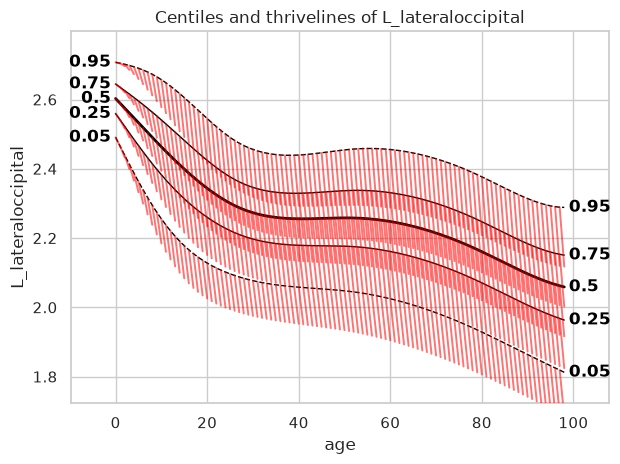

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:46:46 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:46:46 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:46:46 - Computing centiles for L_lateralorbitofrontal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


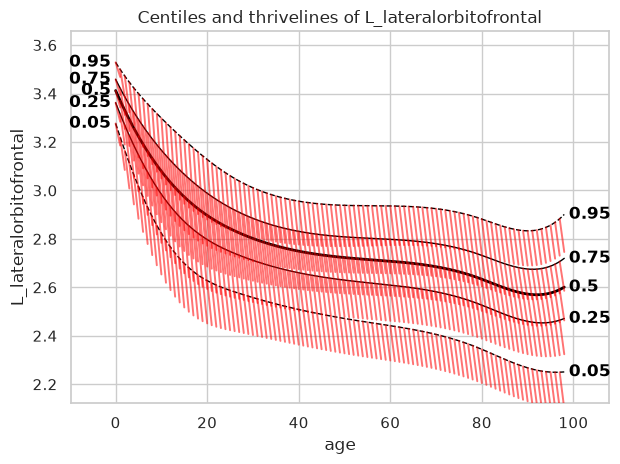

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:48:00 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:48:00 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:48:00 - Computing centiles for L_lingual.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


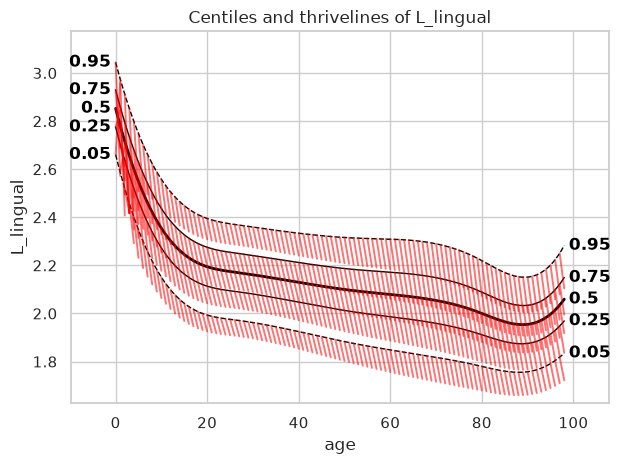

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:49:12 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:49:12 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:49:12 - Computing centiles for L_medialorbitofrontal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


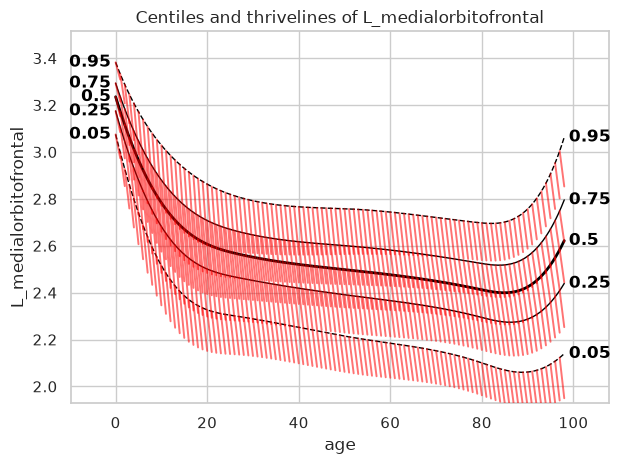

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:50:22 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:50:22 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:50:22 - Computing centiles for L_middletemporal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


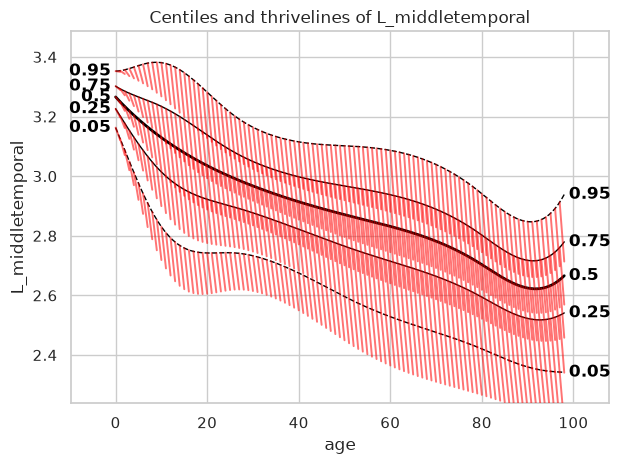

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:51:34 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:51:34 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:51:34 - Computing centiles for L_parahippocampal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


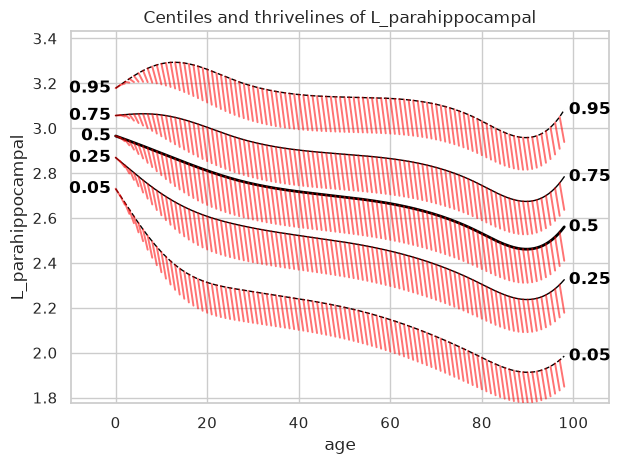

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:52:41 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:52:41 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:52:41 - Computing centiles for L_paracentral.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


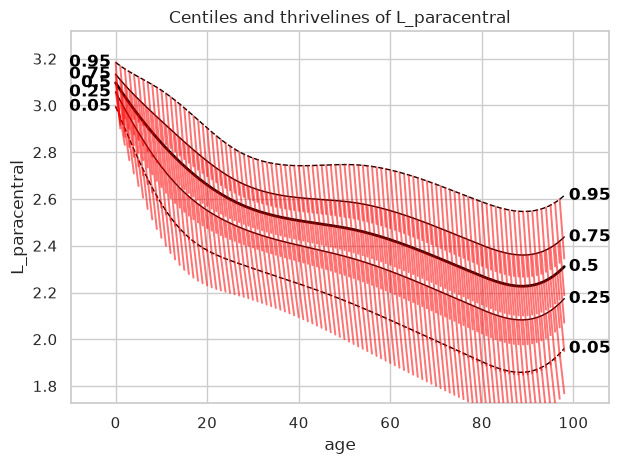

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:53:49 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:53:49 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:53:49 - Computing centiles for L_parsopercularis.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


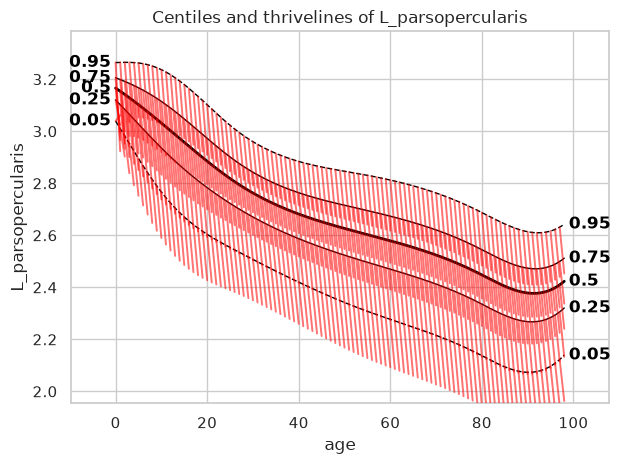

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:54:58 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:54:58 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:54:58 - Computing centiles for L_parsorbitalis.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


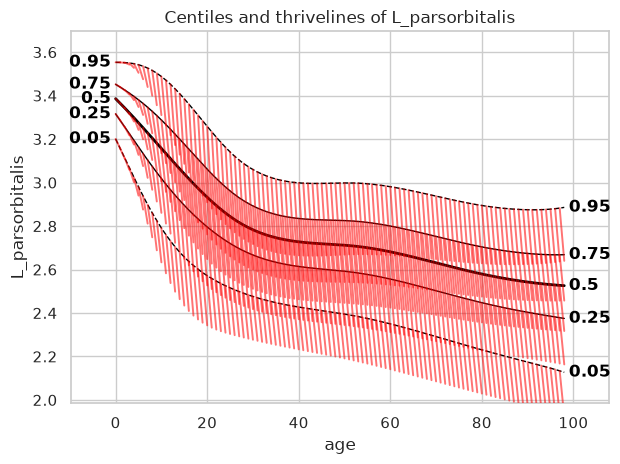

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:56:08 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:56:08 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:56:08 - Computing centiles for L_parstriangularis.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


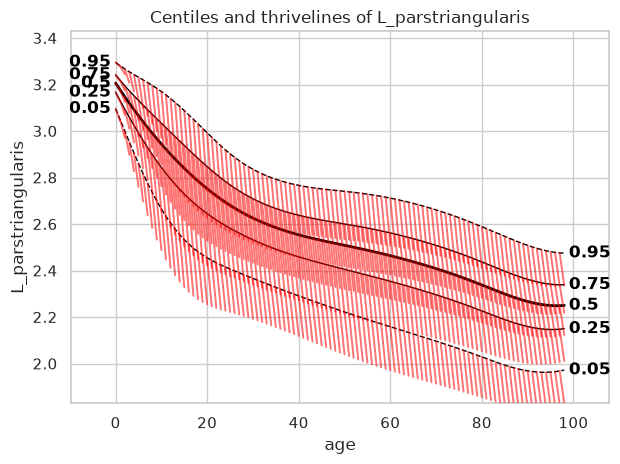

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:57:17 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:57:17 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:57:17 - Computing centiles for L_pericalcarine.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


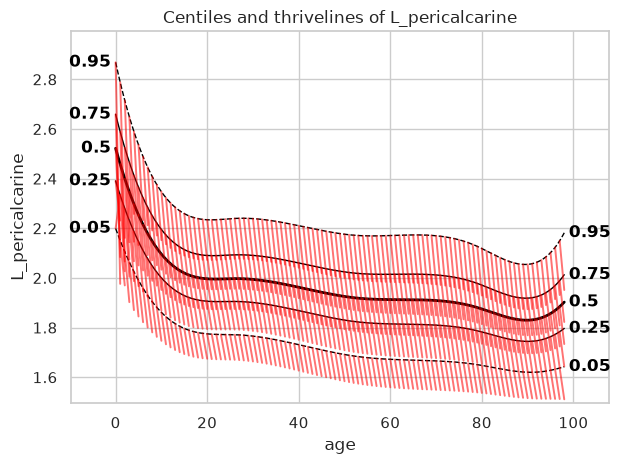

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:58:26 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:58:26 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:58:26 - Computing centiles for L_postcentral.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


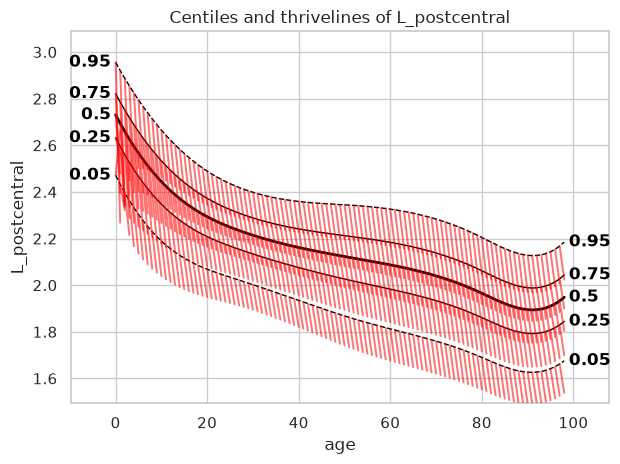

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 20:59:34 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 20:59:34 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 20:59:34 - Computing centiles for L_posteriorcingulate.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


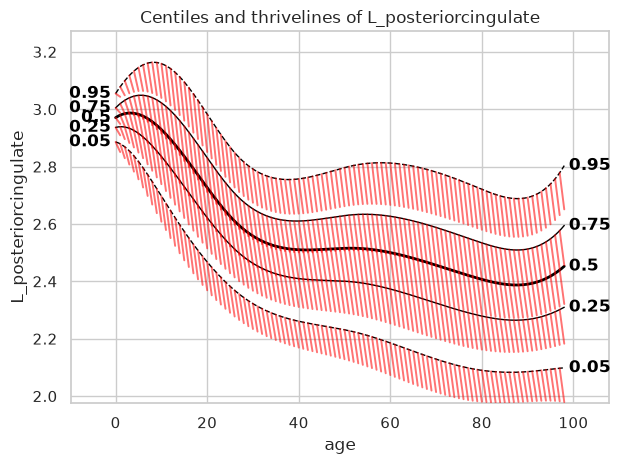

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:00:41 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:00:41 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:00:41 - Computing centiles for L_precentral.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


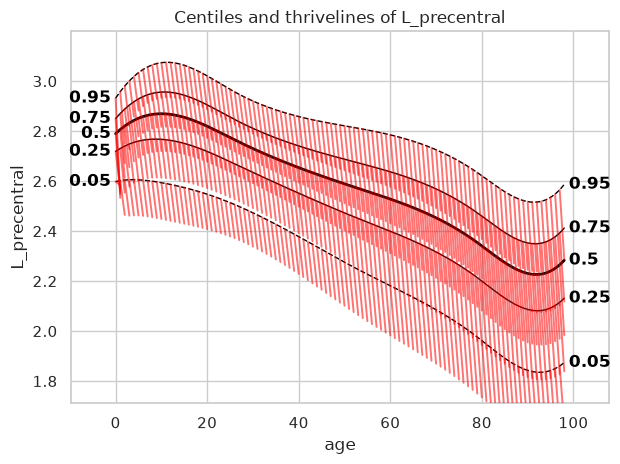

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:01:49 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:01:49 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:01:49 - Computing centiles for L_precuneus.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


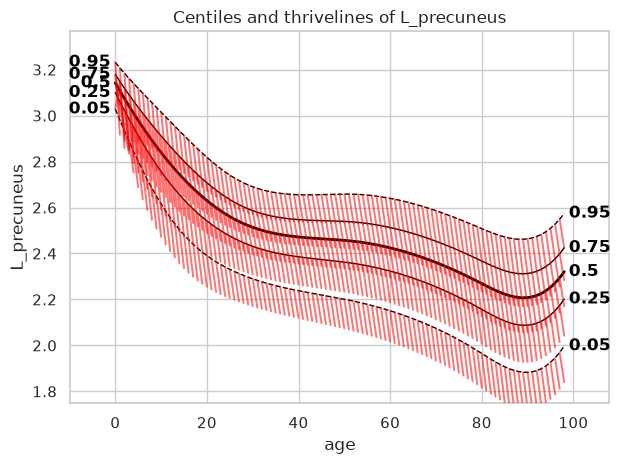

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:02:57 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:02:57 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:02:57 - Computing centiles for L_rostralanteriorcingulate.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


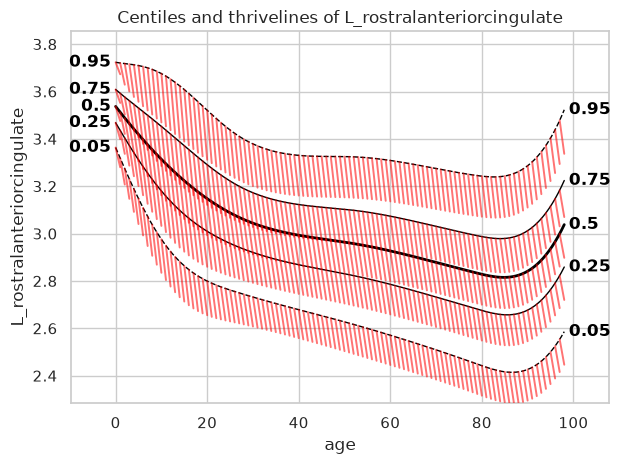

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:04:06 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:04:06 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:04:06 - Computing centiles for L_rostralmiddlefrontal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


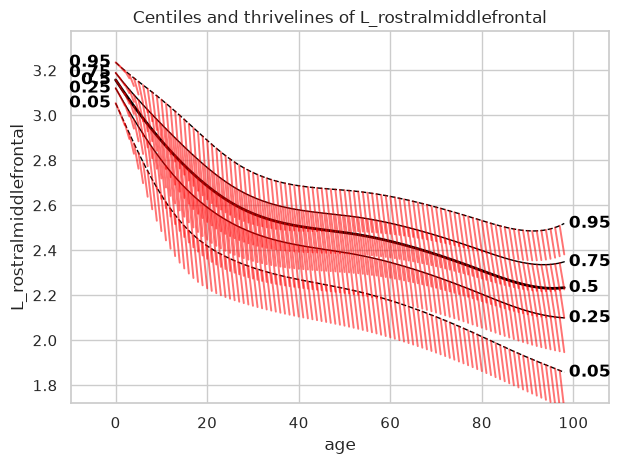

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:05:15 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:05:15 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:05:15 - Computing centiles for L_superiorfrontal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


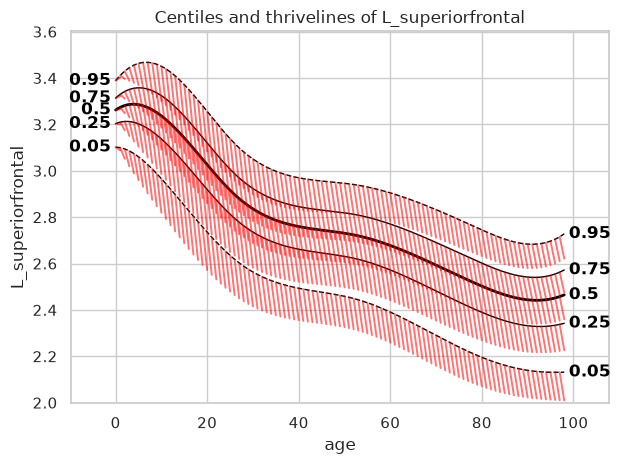

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:06:59 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:06:59 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:06:59 - Computing centiles for L_superiorparietal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


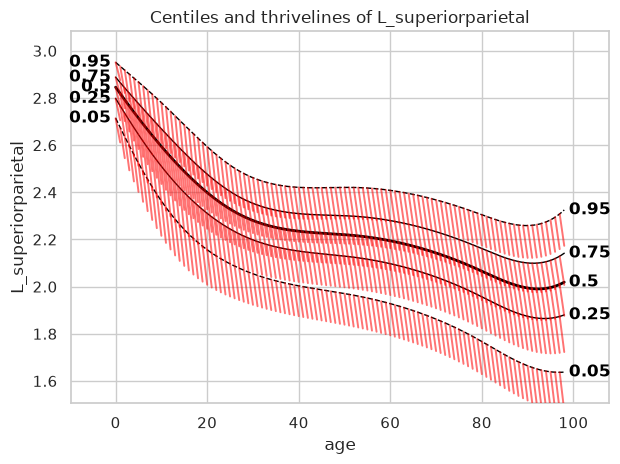

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:08:08 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:08:08 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:08:08 - Computing centiles for L_superiortemporal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


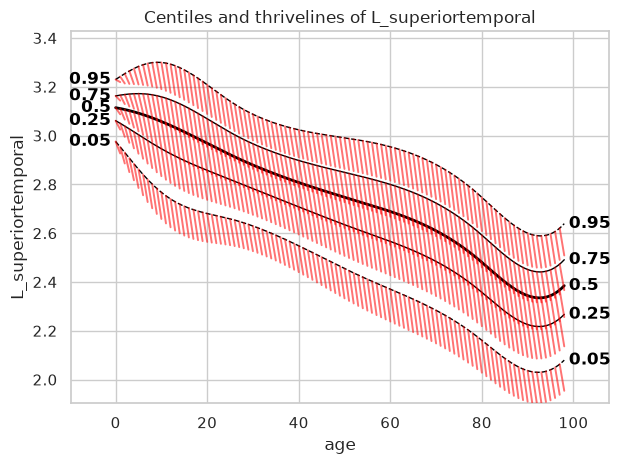

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:09:17 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:09:17 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:09:17 - Computing centiles for L_supramarginal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


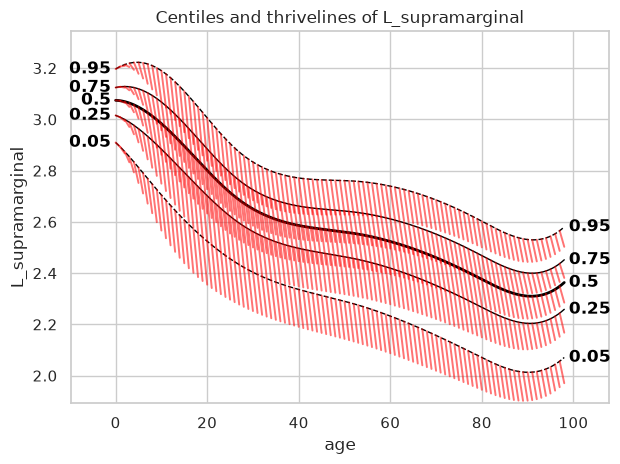

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:10:27 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:10:27 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:10:27 - Computing centiles for L_frontalpole.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


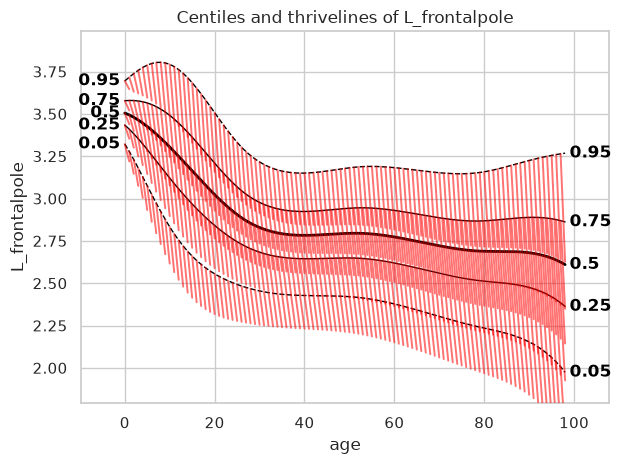

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:11:34 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:11:34 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:11:34 - Computing centiles for L_temporalpole.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


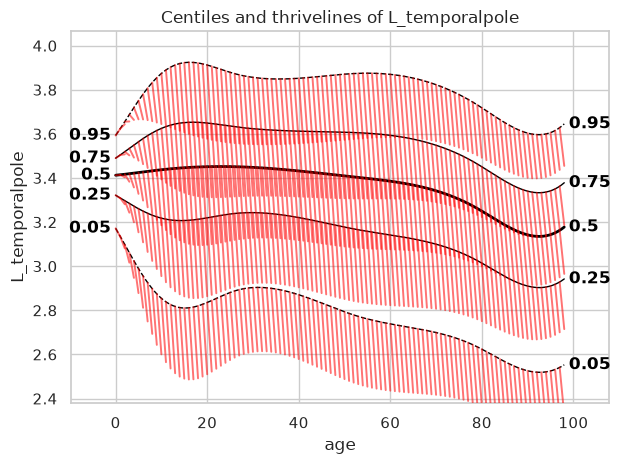

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:12:43 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:12:43 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:12:43 - Computing centiles for L_transversetemporal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


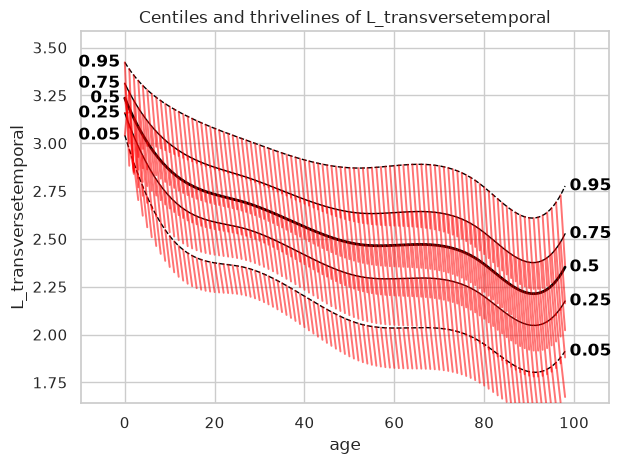

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:14:02 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:14:02 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:14:02 - Computing centiles for L_insula.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


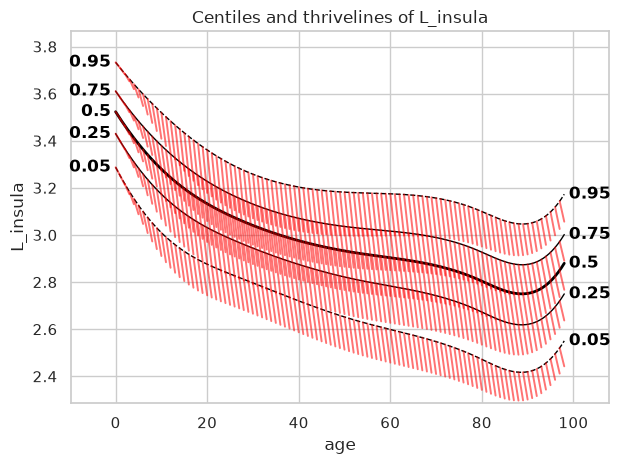

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:15:40 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:15:40 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:15:40 - Computing centiles for R_bankssts.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


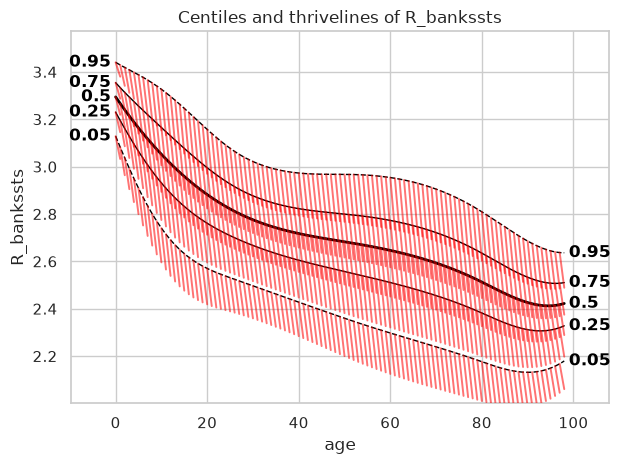

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:17:29 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:17:29 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:17:29 - Computing centiles for R_caudalanteriorcingulate.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


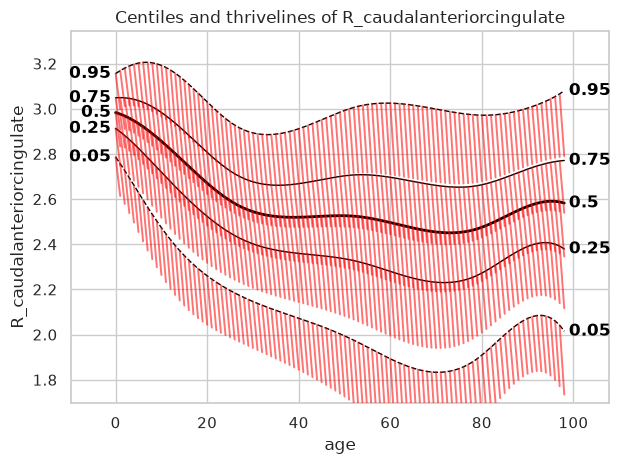

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:19:20 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:19:20 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:19:20 - Computing centiles for R_caudalmiddlefrontal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


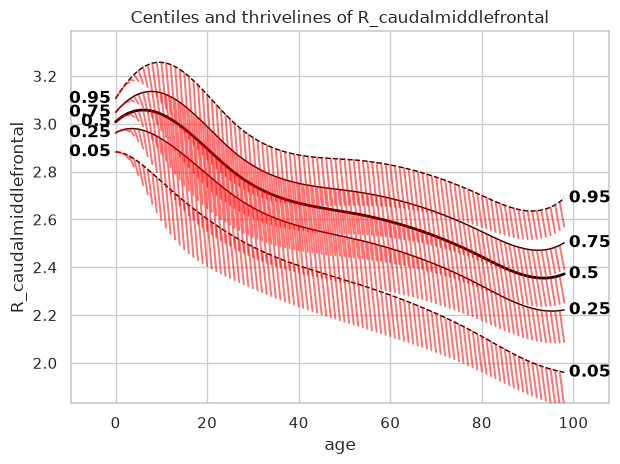

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:21:13 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:21:13 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:21:13 - Computing centiles for R_cuneus.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


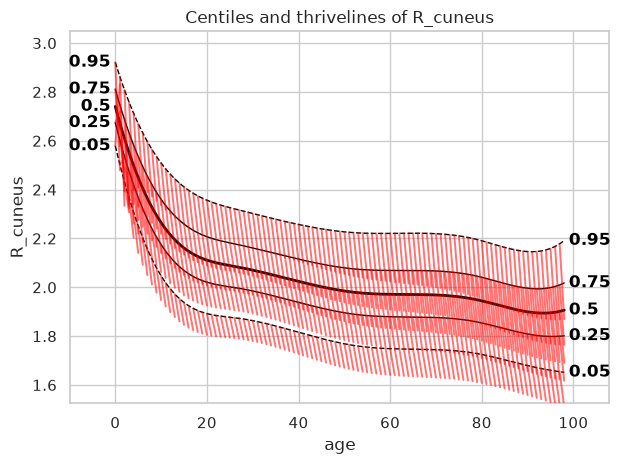

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:23:04 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:23:04 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:23:04 - Computing centiles for R_entorhinal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


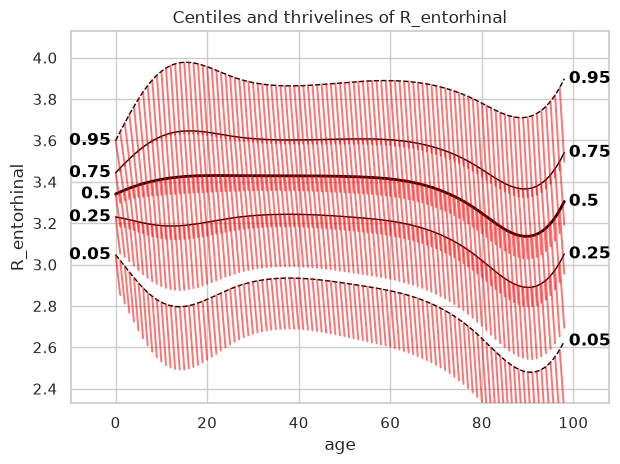

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:24:53 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:24:53 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:24:53 - Computing centiles for R_fusiform.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


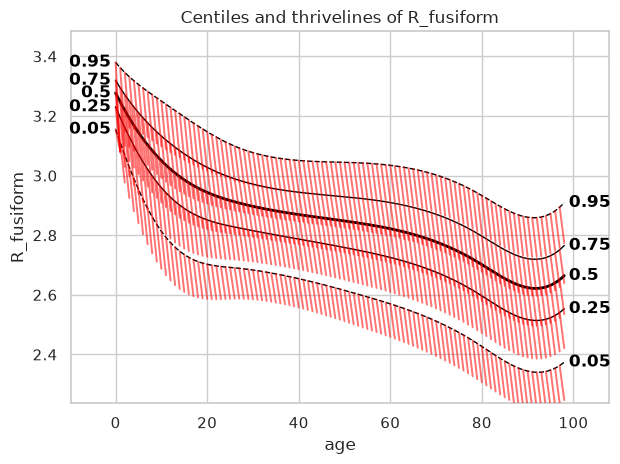

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:26:45 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:26:45 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:26:45 - Computing centiles for R_inferiorparietal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


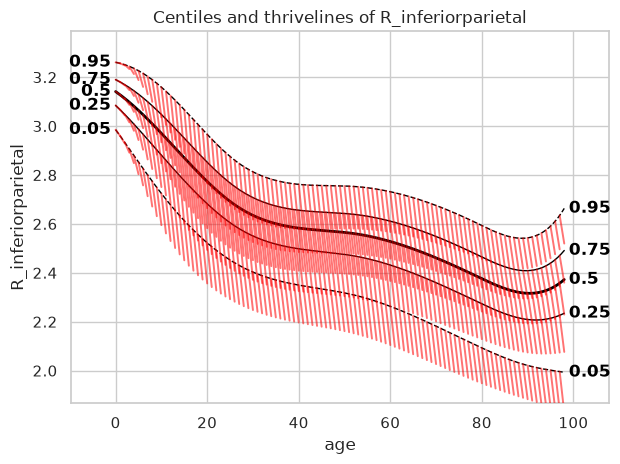

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:28:46 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:28:46 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:28:46 - Computing centiles for R_inferiortemporal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


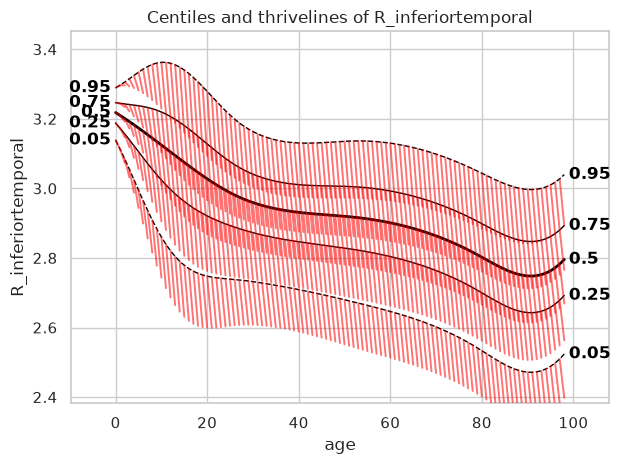

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:30:36 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:30:36 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:30:36 - Computing centiles for R_isthmuscingulate.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


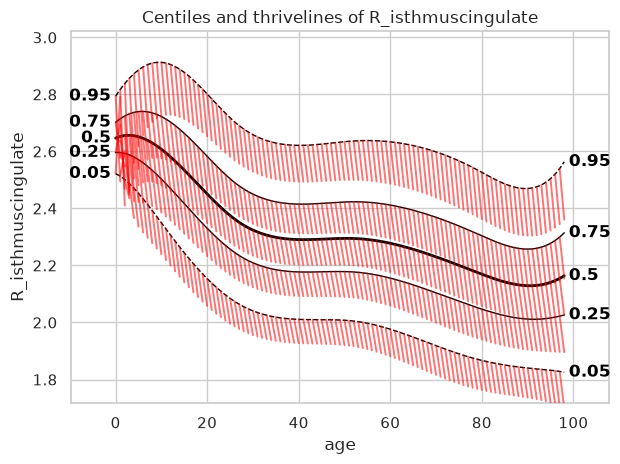

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:32:29 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:32:29 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:32:29 - Computing centiles for R_lateraloccipital.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


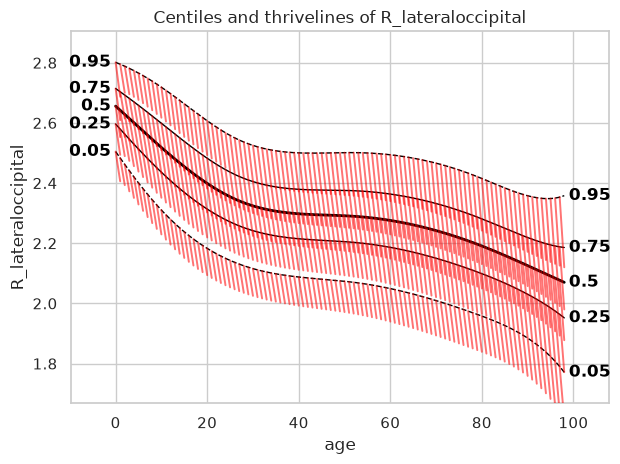

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:34:25 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:34:25 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:34:25 - Computing centiles for R_lateralorbitofrontal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


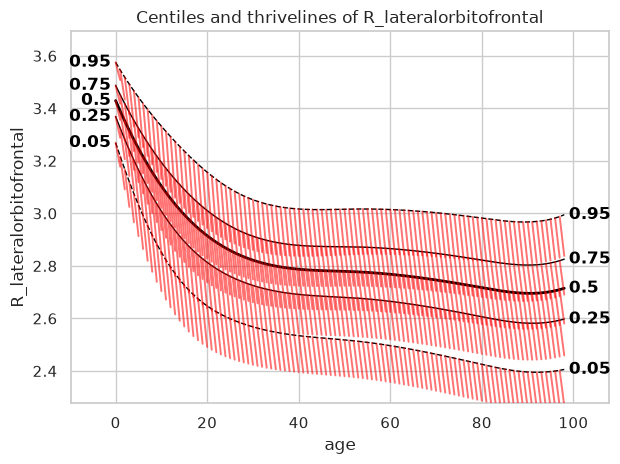

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:36:19 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:36:19 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:36:19 - Computing centiles for R_lingual.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


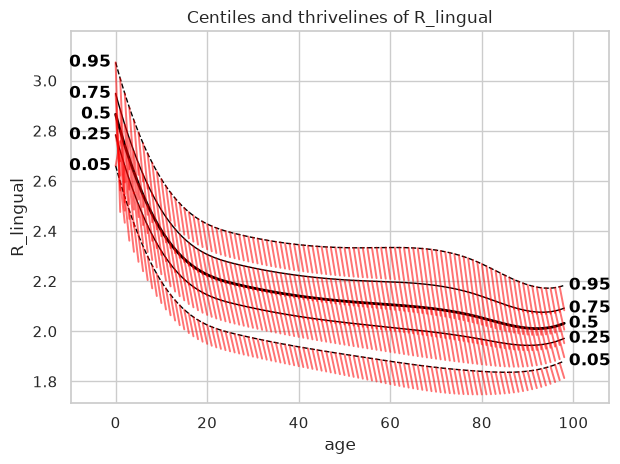

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:38:12 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:38:12 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:38:12 - Computing centiles for R_medialorbitofrontal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


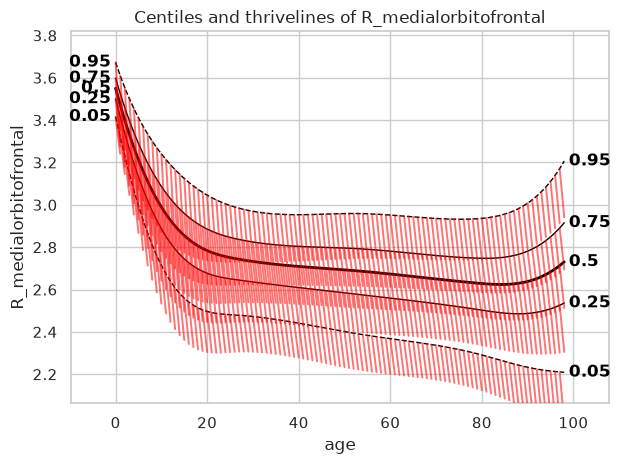

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:40:04 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:40:04 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:40:04 - Computing centiles for R_middletemporal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


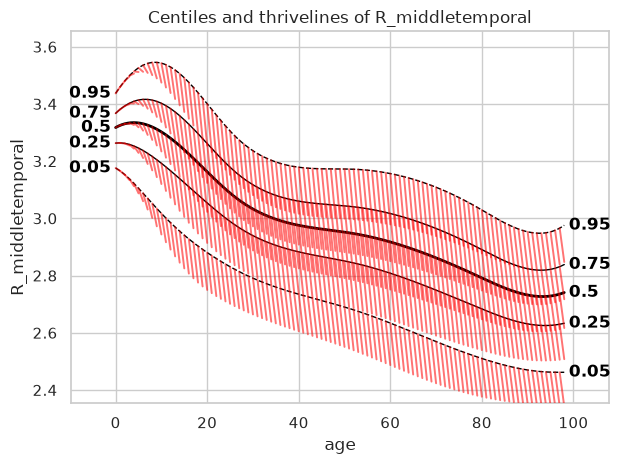

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:41:53 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:41:53 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:41:53 - Computing centiles for R_parahippocampal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


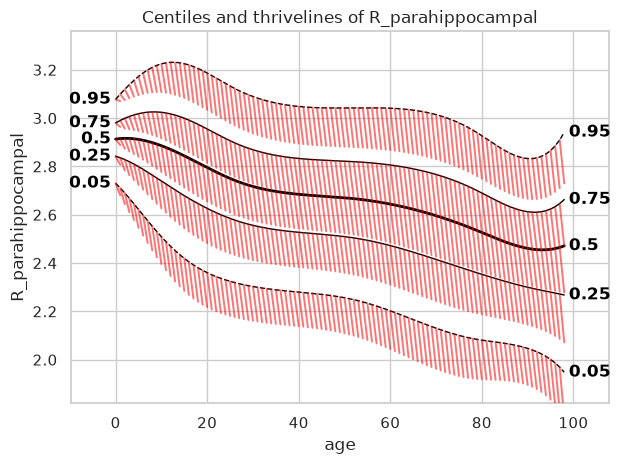

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:43:42 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:43:42 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:43:42 - Computing centiles for R_paracentral.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


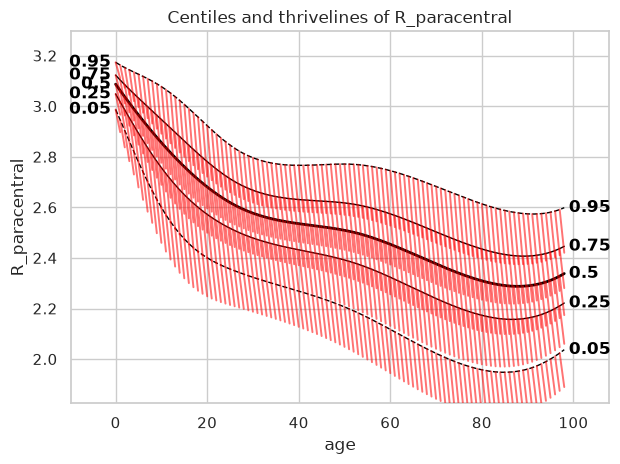

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:45:30 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:45:30 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:45:30 - Computing centiles for R_parsopercularis.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


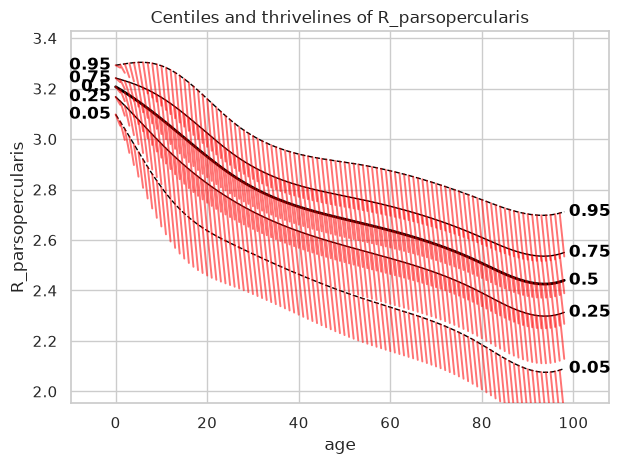

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:47:16 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:47:16 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:47:16 - Computing centiles for R_parsorbitalis.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


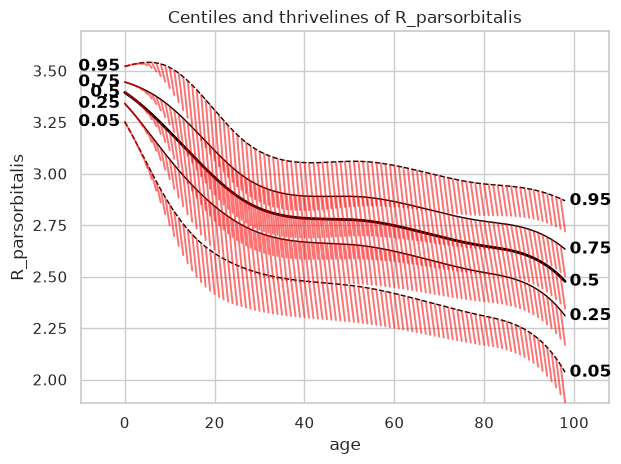

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:49:03 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:49:03 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:49:03 - Computing centiles for R_parstriangularis.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


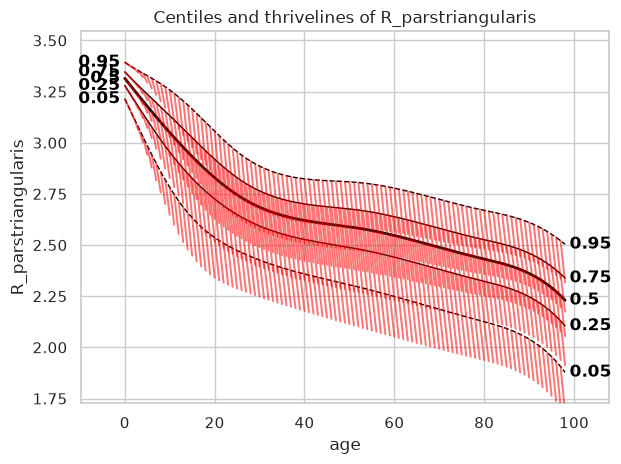

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:50:50 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:50:50 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:50:50 - Computing centiles for R_pericalcarine.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


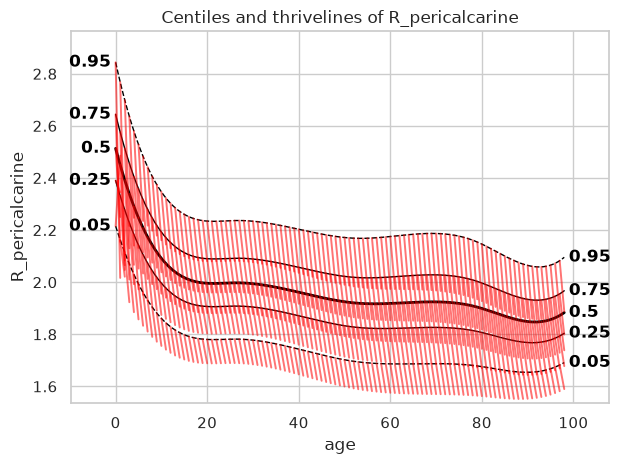

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:52:35 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:52:35 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:52:35 - Computing centiles for R_postcentral.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


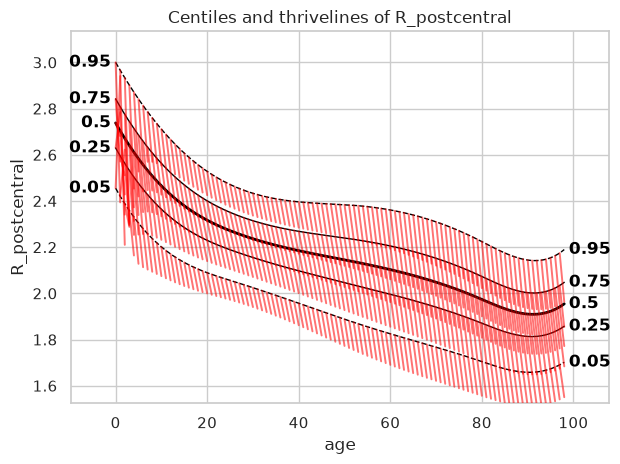

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:54:24 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:54:24 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:54:24 - Computing centiles for R_posteriorcingulate.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


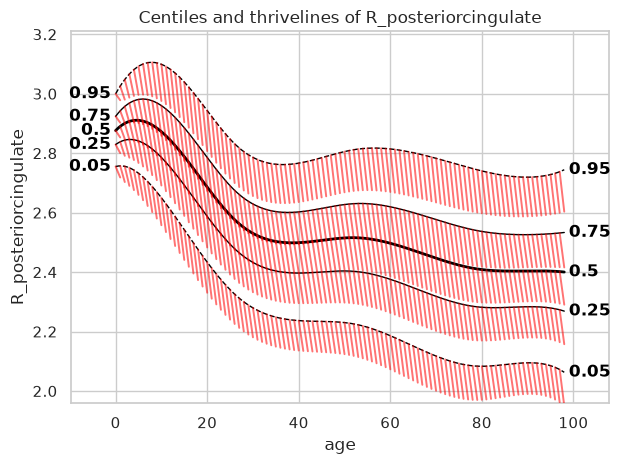

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:56:10 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:56:10 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:56:10 - Computing centiles for R_precentral.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


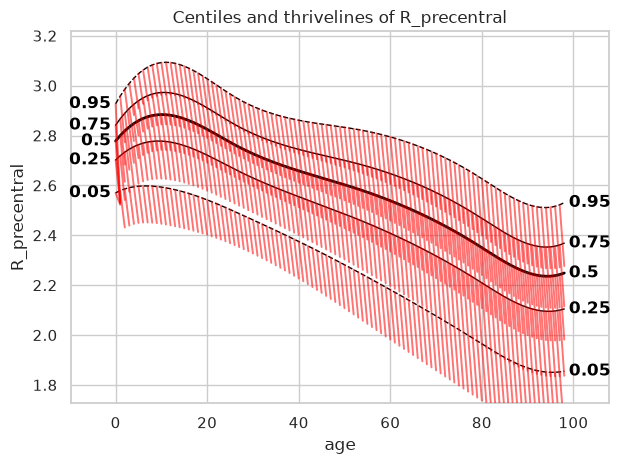

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:57:17 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:57:17 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:57:17 - Computing centiles for R_precuneus.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


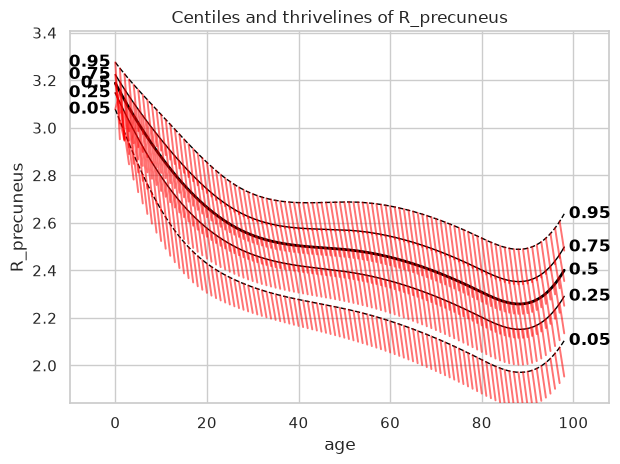

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:58:27 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:58:27 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:58:27 - Computing centiles for R_rostralanteriorcingulate.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


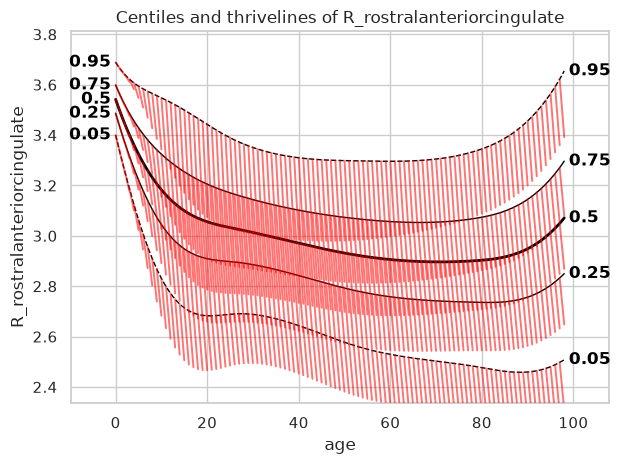

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 21:59:36 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 21:59:36 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 21:59:36 - Computing centiles for R_rostralmiddlefrontal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


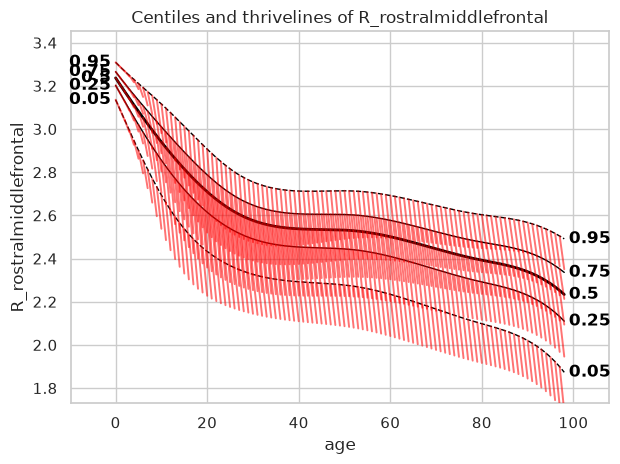

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 22:00:45 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 22:00:45 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 22:00:45 - Computing centiles for R_superiorfrontal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


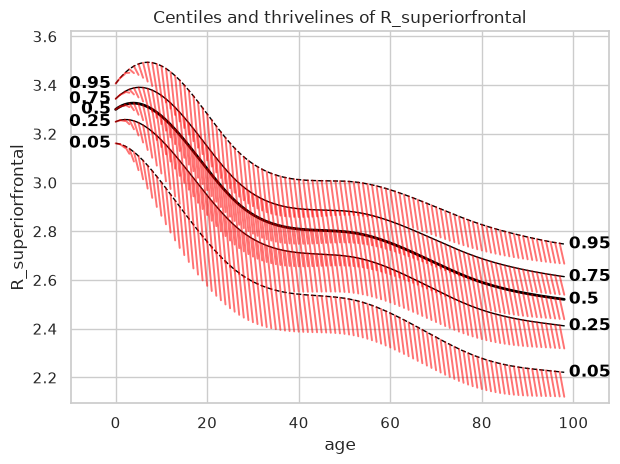

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 22:01:55 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 22:01:55 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 22:01:55 - Computing centiles for R_superiorparietal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


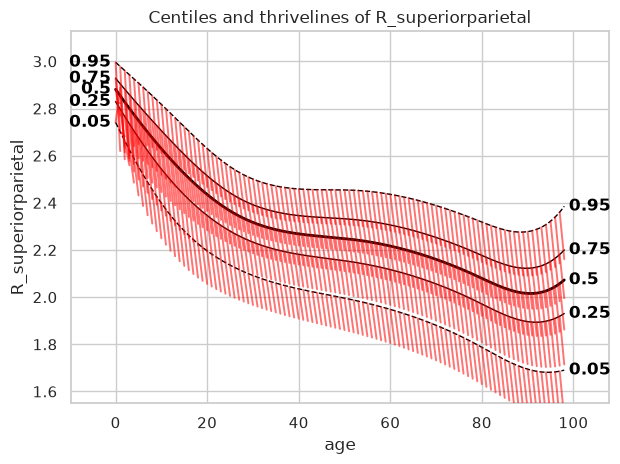

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 22:03:03 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 22:03:03 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 22:03:03 - Computing centiles for R_superiortemporal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


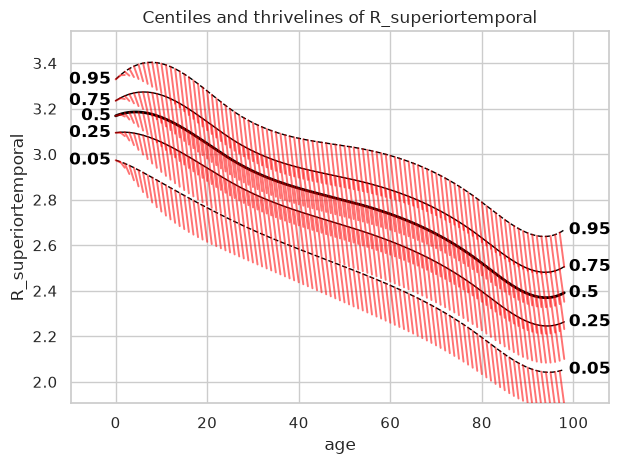

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 22:04:14 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 22:04:14 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 22:04:14 - Computing centiles for R_supramarginal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


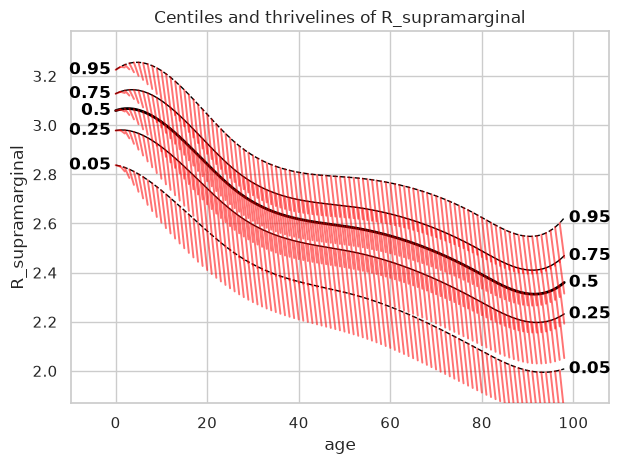

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 22:05:24 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 22:05:24 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 22:05:24 - Computing centiles for R_frontalpole.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


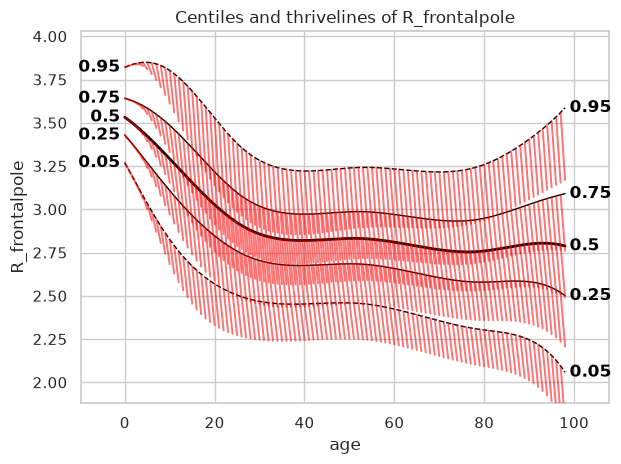

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 22:06:31 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 22:06:31 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 22:06:31 - Computing centiles for R_temporalpole.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


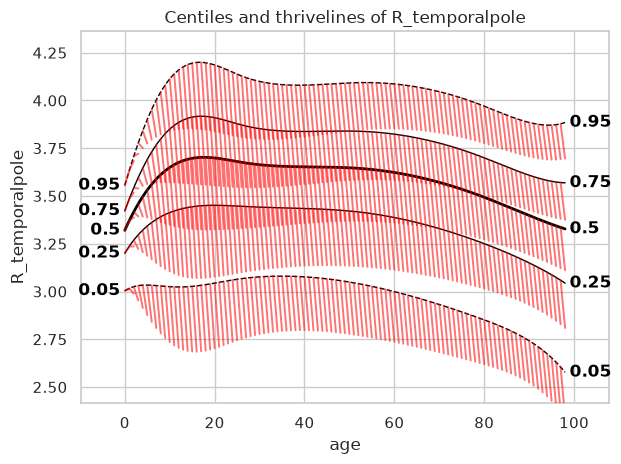

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 22:07:39 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 22:07:39 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 22:07:39 - Computing centiles for R_transversetemporal.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


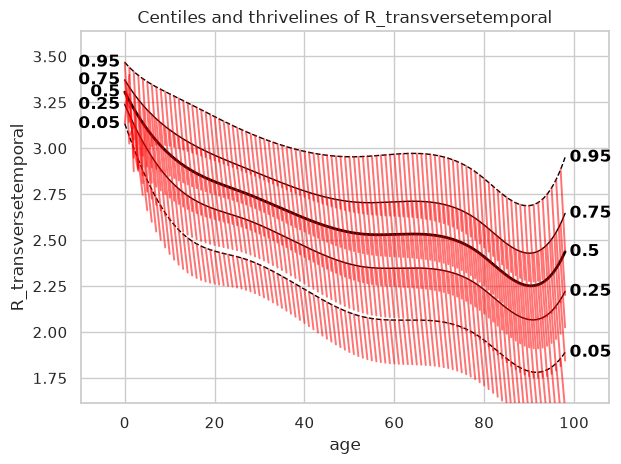

Sampling: []
Sampling: []


Process: 2085053 - 2026-09-11 22:08:46 - Dataset "centile" created.
    - 150 observations
    - 150 unique subjects
    - 1 covariates
    - 1 response variables
    - 2 batch effects:
    	sex (1)
	site_id2 (1)
    
Process: 2085053 - 2026-09-11 22:08:46 - Computing centiles for 1 response variables.
Process: 2085053 - 2026-09-11 22:08:46 - Computing centiles for R_insula.


Sampling: []
Sampling: []
Sampling: []
Sampling: []
Sampling: []


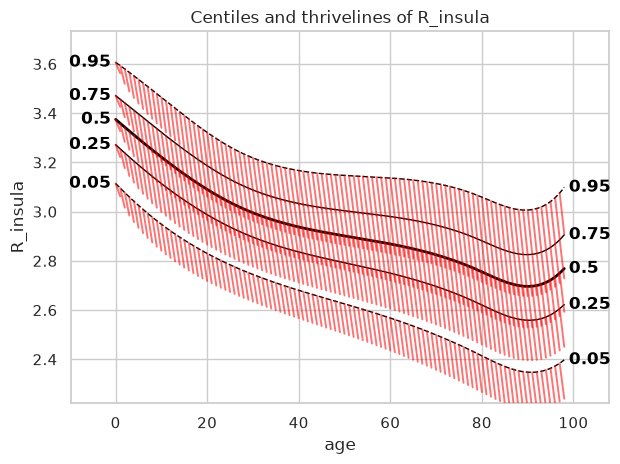

FileNotFoundError: [Errno 2] No such file or directory: '/project_cephfs/3022017.06/projects/lifespan_hbr/johbay/Velocity/Velocity_models/DK_demented/batch_69_Mean_Thickness/Velocity/velocity_objects_new_Oct25.pkl'

In [7]:
for i, response_vars in enumerate(features_to_model):
    MATRIX_PATH = (
        f"/project_cephfs/3022017.06/projects/lifespan_hbr/johbay/Velocity/Velocity_models/DK_demented/batch_{i+1}_{response_vars}/Velocity/velocity_objects_new_Oct25.pkl"
    )
    
    # The region is read from the batch_1_lh_G_and_S_frontomargin directory.
    corr = CorrelationMatrix.load(MATRIX_PATH)
    REGION = str(corr.matrix.coords["response_vars"].values[0])

    centiles = [0.05, 0.25, 0.5, 0.75, 0.95]

    thrivelines = ZGainScore(model, corr).get_thrivelines(
        z_anchors=stats.norm.ppf(centiles),
    )
    
    import matplotlib.pyplot as plt
    import warnings
    warnings.filterwarnings("ignore") 
    plot_thrivelines(
        model,
        thrivelines=thrivelines,
        centiles=centiles,
        covariate="age",
        response_vars=[REGION],
        save_dir ='/project_cephfs/3022017.06/projects/lifespan_hbr/johbay/Velocity/CODE_new/revision/thriveline_plots/'
    )
